In [1]:
# Import dependencies
from matplotlib import pyplot as plt
from scipy.stats import linregress
import numpy as np
from sklearn import datasets
import pandas as pd
import seaborn as sns
import plotly.express as px
from pandas.plotting import scatter_matrix
import pgeocode




In [2]:
# Import the data from the CSV file
mls_df = pd.read_csv("Clean_Data/mls_condo_cleaned_2.csv")
mls_df.head()

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster,Price per SqFt
0,2372641,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,324999,344,-1525001,35.8014,-78.6877,2,34.662863
1,2410217,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000,36.0330,-79.5972,1,463.983961
2,2375877,Wake Forest,27587,5,5,7200,7,2005,2021-04-05,2021-05-27,1800000,2900000,52,1100000,35.9815,-78.5392,2,402.777778
3,2378933,Raleigh,27615,5,7,6289,3,2022,2021-04-20,2022-09-28,2550000,3577591,526,1027591,35.8887,-78.6393,2,568.864843
4,2495996,Apex,27502,4,6,7266,5,2023,2023-02-21,2023-11-21,1755900,2598548,273,842648,35.7225,-78.8408,4,357.631159


In [3]:
# Copy the data frame to a new data frame
sfr_df = mls_df.copy()

sfr_df.head()

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster,Price per SqFt
0,2372641,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,324999,344,-1525001,35.8014,-78.6877,2,34.662863
1,2410217,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000,36.0330,-79.5972,1,463.983961
2,2375877,Wake Forest,27587,5,5,7200,7,2005,2021-04-05,2021-05-27,1800000,2900000,52,1100000,35.9815,-78.5392,2,402.777778
3,2378933,Raleigh,27615,5,7,6289,3,2022,2021-04-20,2022-09-28,2550000,3577591,526,1027591,35.8887,-78.6393,2,568.864843
4,2495996,Apex,27502,4,6,7266,5,2023,2023-02-21,2023-11-21,1755900,2598548,273,842648,35.7225,-78.8408,4,357.631159


In [4]:
sfr_df.describe()

,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster,Price per SqFt
count,112530.000000,112530.000000,112530.000000,112530.000000,112530.000000,112530.000000,1.125300e+05,1.125300e+05,112530.000000,1.125300e+05,112530.000000,112530.000000,112530.000000,112530.000000
mean,27576.573252,3.520608,2.901271,2324.686306,2.339794,1999.367991,4.657109e+05,4.715411e+05,89.293957,5.830195e+03,35.799324,-78.712270,1.917897,202.579577
std,297.704813,0.814684,1.012558,1001.876866,1.549029,25.465435,2.971462e+05,2.949838e+05,86.604670,3.645621e+04,0.252813,0.364363,1.348901,73.616550
min,17502.000000,1.000000,1.000000,200.000000,1.000000,1721.000000,1.000000e+04,3.450000e+02,0.000000,-1.995000e+06,30.628500,-101.238700,0.000000,0.138805
25%,27520.000000,3.000000,2.000000,1600.000000,1.000000,1988.000000,3.000000e+05,3.060000e+05,38.000000,-4.500000e+03,35.634800,-78.887000,1.000000,160.020052
50%,27559.000000,3.000000,3.000000,2176.000000,2.000000,2006.000000,3.990000e+05,4.015000e+05,56.000000,0.000000e+00,35.807200,-78.687700,2.000000,193.016594
75%,27610.000000,4.000000,3.000000,2824.000000,3.000000,2021.000000,5.499000e+05,5.555045e+05,109.000000,1.300000e+04,35.978100,-78.489800,3.000000,232.292950
max,77332.000000,14.000000,17.000000,20283.000000,8.000000,2025.000000,7.000000e+06,6.625000e+06,1821.000000,1.940000e+06,43.886000,-75.467900,4.000000,3438.789546


In [5]:
sfr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112530 entries, 0 to 112529
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   MLS #           112530 non-null  object 
 1   City            112530 non-null  object 
 2   Zip             112530 non-null  int64  
 3   Bedrooms        112530 non-null  int64  
 4   Total Baths     112530 non-null  int64  
 5   SqFt            112530 non-null  int64  
 6   Acres           112530 non-null  int64  
 7   Year Built      112530 non-null  int64  
 8   List Date       112530 non-null  object 
 9   Closing Date    112530 non-null  object 
 10  List Price      112530 non-null  int64  
 11  Sold Price      112530 non-null  int64  
 12  Days on Market  112530 non-null  int64  
 13  Over Asking     112530 non-null  int64  
 14  Lat             112530 non-null  float64
 15  Lon             112530 non-null  float64
 16  Cluster         112530 non-null  int64  
 17  Price per 

In [6]:
#Create a copy of the data frame and drop the non-numeric columns
sfr_nostr_df = sfr_df.copy()
sfr_nostr_df = sfr_nostr_df.drop(columns=['City'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['List Date'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['Closing Date'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['MLS #'])

# Save the DataFrame to a CSV file
sfr_nostr_df.to_csv('Clean_Data/mls_sfr_cleaned_nostring.csv', index=False)

#Create a correlation matrix
corr_matrix = sfr_nostr_df.corr()
corr_matrix["Sold Price"].sort_values(ascending=False)

Sold Price        1.000000
List Price        0.992445
SqFt              0.770722
Total Baths       0.691850
Price per SqFt    0.536247
Bedrooms          0.470531
Year Built        0.202808
Acres             0.131981
Days on Market    0.131972
Lat               0.076236
Cluster           0.076141
Over Asking       0.002262
Zip              -0.054253
Lon              -0.111468
Name: Sold Price, dtype: float64

array([[<Axes: xlabel='Sold Price', ylabel='Sold Price'>,
        <Axes: xlabel='SqFt', ylabel='Sold Price'>,
        <Axes: xlabel='Total Baths', ylabel='Sold Price'>,
        <Axes: xlabel='Bedrooms', ylabel='Sold Price'>,
        <Axes: xlabel='Lat', ylabel='Sold Price'>,
        <Axes: xlabel='Lon', ylabel='Sold Price'>],
       [<Axes: xlabel='Sold Price', ylabel='SqFt'>,
        <Axes: xlabel='SqFt', ylabel='SqFt'>,
        <Axes: xlabel='Total Baths', ylabel='SqFt'>,
        <Axes: xlabel='Bedrooms', ylabel='SqFt'>,
        <Axes: xlabel='Lat', ylabel='SqFt'>,
        <Axes: xlabel='Lon', ylabel='SqFt'>],
       [<Axes: xlabel='Sold Price', ylabel='Total Baths'>,
        <Axes: xlabel='SqFt', ylabel='Total Baths'>,
        <Axes: xlabel='Total Baths', ylabel='Total Baths'>,
        <Axes: xlabel='Bedrooms', ylabel='Total Baths'>,
        <Axes: xlabel='Lat', ylabel='Total Baths'>,
        <Axes: xlabel='Lon', ylabel='Total Baths'>],
       [<Axes: xlabel='Sold Price', ylabel='Be

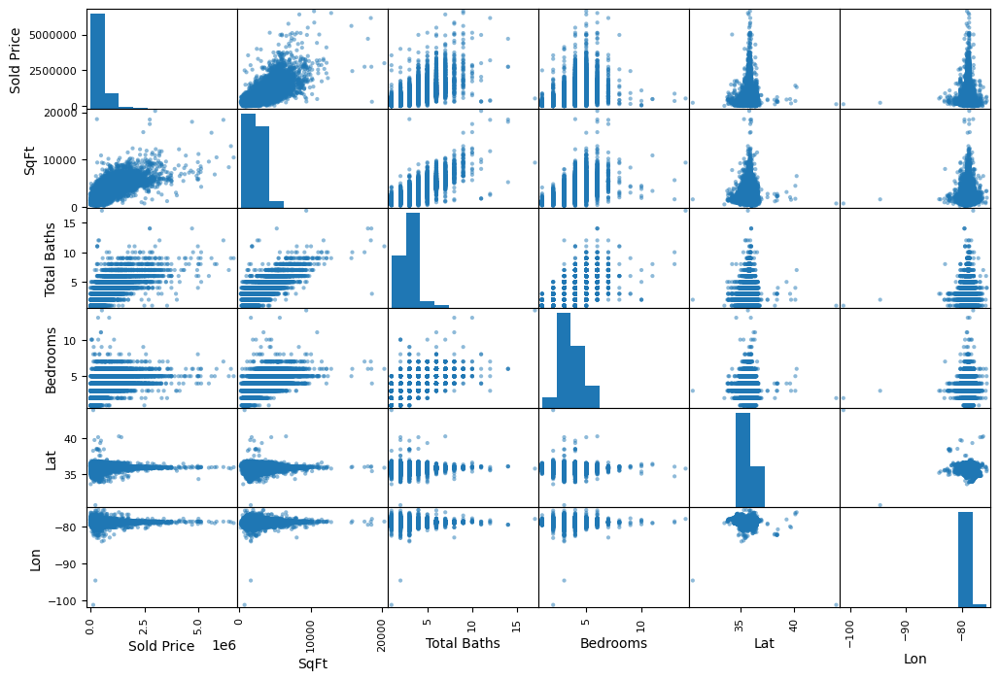

In [7]:
#Visualize the scatter matrix
scatter_columns = ["Sold Price", "SqFt", "Total Baths", "Bedrooms", 'Lat', 'Lon']
scatter_matrix(sfr_nostr_df[scatter_columns], figsize=(12, 8))
#plt.savefig('matrix.png')

<Axes: xlabel='SqFt', ylabel='Sold Price'>

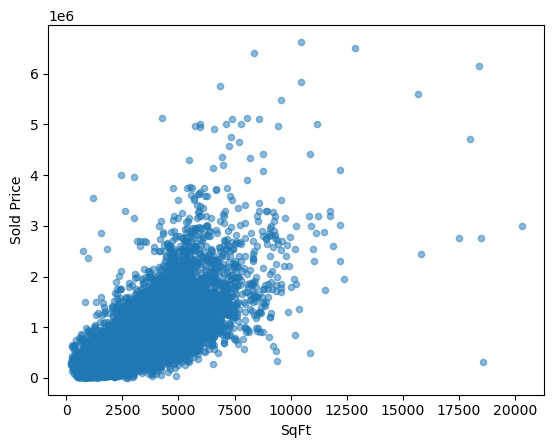

In [8]:
#Visualize the scatter plot for Total Living Area SqFt vs Sold Price
sfr_nostr_df.plot(kind="scatter", x="SqFt", y="Sold Price", alpha=0.5)
#plt.savefig('scatter.png')

In [9]:
#Create a new column for the price per square foot
sfr_nostr_df['Price per SqFt'] = sfr_nostr_df['Sold Price'] / sfr_nostr_df['SqFt']

#Create a correlation matrix to see what the correlation is for Price per SqFt
corr_matrix = sfr_nostr_df.corr()
corr_matrix["Sold Price"].sort_values(ascending=False)

Sold Price        1.000000
List Price        0.992445
SqFt              0.770722
Total Baths       0.691850
Price per SqFt    0.536247
Bedrooms          0.470531
Year Built        0.202808
Acres             0.131981
Days on Market    0.131972
Lat               0.076236
Cluster           0.076141
Over Asking       0.002262
Zip              -0.054253
Lon              -0.111468
Name: Sold Price, dtype: float64

In [10]:
#Check the orginal data frame to see how many cities are in the data
len(sfr_df['City'].value_counts())

372

/opt/anaconda3/envs/dev/lib/python3.11/site-packages/threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


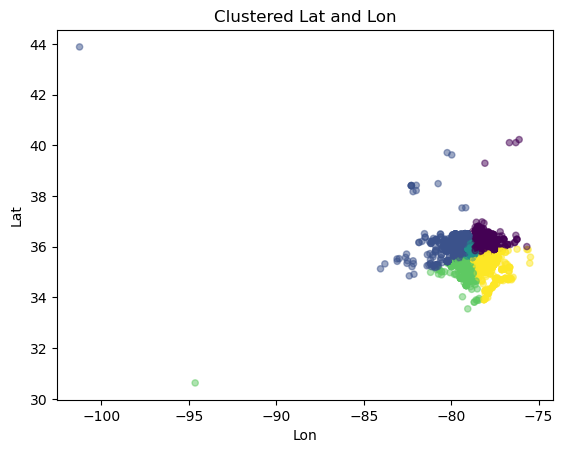

In [11]:
#Cluster the Lat and  Lon into groups
from sklearn.cluster import KMeans
sfr_df['Cluster'] = KMeans(n_clusters=5).fit_predict(sfr_df[['Lat', 'Lon']])
sfr_df.plot(kind="scatter", x="Lon", y="Lat", c="Cluster", cmap='viridis', colorbar=False, alpha=0.5)
plt.title('Clustered Lat and Lon')
plt.savefig('clustered.png')


In [12]:
#Create a variable for the top 10 cities with the highest average sold price
top10 = sfr_df.groupby('City')['Sold Price'].mean().nlargest(373).reset_index()

#Plot the top 10 cities with the highest average sold price
fig = px.bar(top10, x='City', y='Sold Price',color='City', template='plotly',
             title='Cities with Highest Avg. Sold Price') 
fig.update_traces(textposition='outside')
fig.show()

In [13]:
top10 = sfr_df.groupby('City')['Total Baths'].mean().nlargest(10).reset_index()

fig = px.bar(top10, x='City', y='Total Baths',color='Total Baths', template='plotly', 
             title='Top 10 Cities with the Most Avg Total Baths')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [14]:
df_mean = sfr_df.groupby('Over Asking')['SqFt'].mean().reset_index()

fig = px.scatter(df_mean, x='Over Asking', y='SqFt', trendline='ols', 
                 labels={'Over Asking':'Over Asking', 'SqFt':'Mean House Size'})
fig.update_layout(title='Distribution of Mean House Size by Over Asking')
fig.show()

In [15]:
fig = px.scatter(sfr_df, x='SqFt', y='Over Asking', color='Bedrooms', size='Total Baths',trendline='ols')
fig.update_layout(title='House Size vs Over Asking',
                  xaxis_title='House Size',
                  yaxis_title='Over Asking')
fig.show()

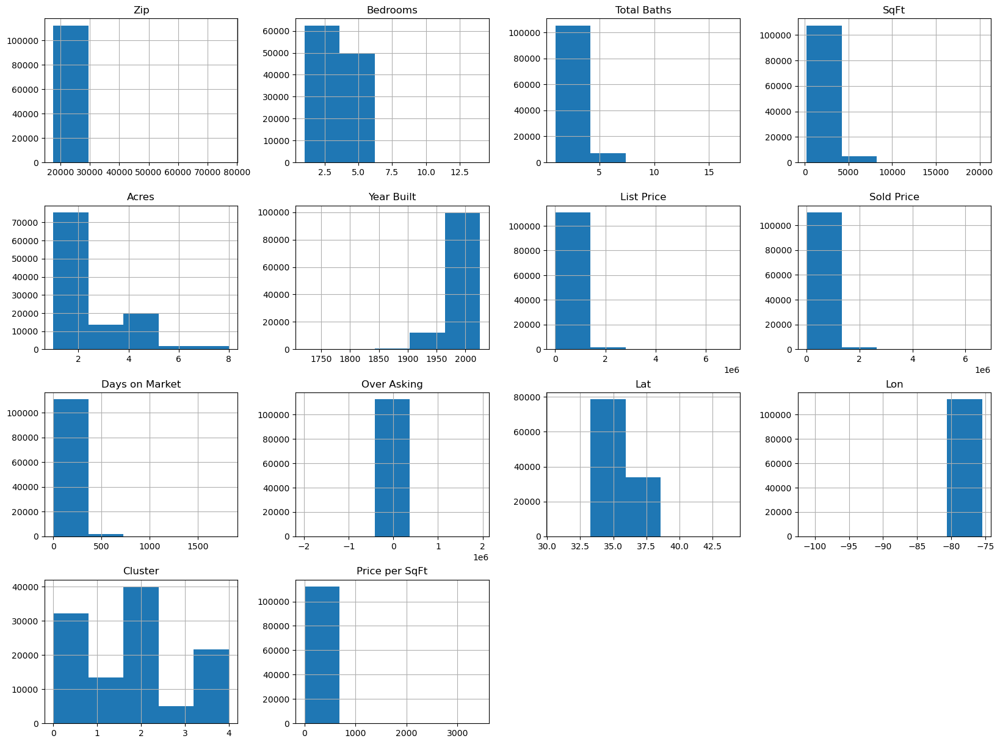

In [16]:
sfr_df.hist(bins=5, figsize=(20,15))
#plt.savefig("attribute_histogram_plots")
plt.show()

In [17]:
sfr_df.head()

,MLS #,City,Zip,Bedrooms,Total Baths,SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days on Market,Over Asking,Lat,Lon,Cluster,Price per SqFt
0,2372641,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,324999,344,-1525001,35.8014,-78.6877,2,34.662863
1,2410217,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000,36.0330,-79.5972,1,463.983961
2,2375877,Wake Forest,27587,5,5,7200,7,2005,2021-04-05,2021-05-27,1800000,2900000,52,1100000,35.9815,-78.5392,0,402.777778
3,2378933,Raleigh,27615,5,7,6289,3,2022,2021-04-20,2022-09-28,2550000,3577591,526,1027591,35.8887,-78.6393,0,568.864843
4,2495996,Apex,27502,4,6,7266,5,2023,2023-02-21,2023-11-21,1755900,2598548,273,842648,35.7225,-78.8408,2,357.631159


In [18]:
# Variable with the Longitude and Latitude
X=sfr_df.loc[:,['MLS #','Lat','Lon']]
X.head(10)

,MLS #,Lat,Lon
0,2372641,35.8014,-78.6877
1,2410217,36.0330,-79.5972
2,2375877,35.9815,-78.5392
3,2378933,35.8887,-78.6393
4,2495996,35.7225,-78.8408
5,2293916,35.7641,-78.7786
6,2448408,35.8480,-78.6317
7,2508624,35.7667,-78.6008
8,2428206,35.7225,-78.8408
9,2437975,35.9631,-78.9315


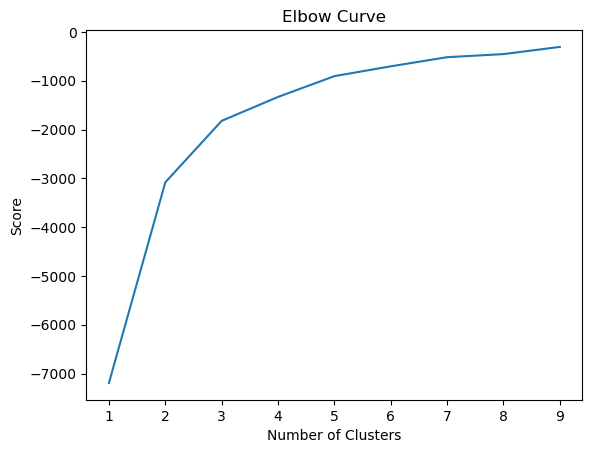

In [19]:
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = sfr_df[['Lat']]
X_axis = sfr_df[['Lon']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [20]:
kmeans = KMeans(n_clusters = 5, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
X.head(10)

,MLS #,Lat,Lon,cluster_label
0,2372641,35.8014,-78.6877,2
1,2410217,36.0330,-79.5972,3
2,2375877,35.9815,-78.5392,0
3,2378933,35.8887,-78.6393,2
4,2495996,35.7225,-78.8408,2
5,2293916,35.7641,-78.7786,2
6,2448408,35.8480,-78.6317,2
7,2508624,35.7667,-78.6008,2
8,2428206,35.7225,-78.8408,2
9,2437975,35.9631,-78.9315,4


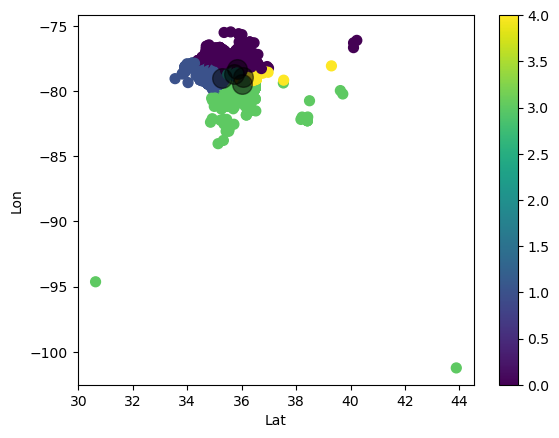

In [21]:
X.plot.scatter(x = 'Lat', y = 'Lon', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

<Axes: xlabel='SqFt'>

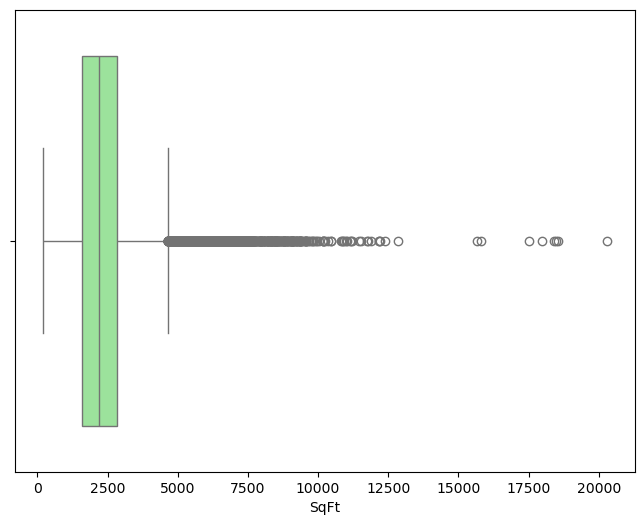

In [22]:
#Visualize the distribution of each numerical feature using box plots. Points beyond the “whiskers” of the box plot can be considered potential outliers.  
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['SqFt'], color='lightgreen')

<Axes: xlabel='Bedrooms'>

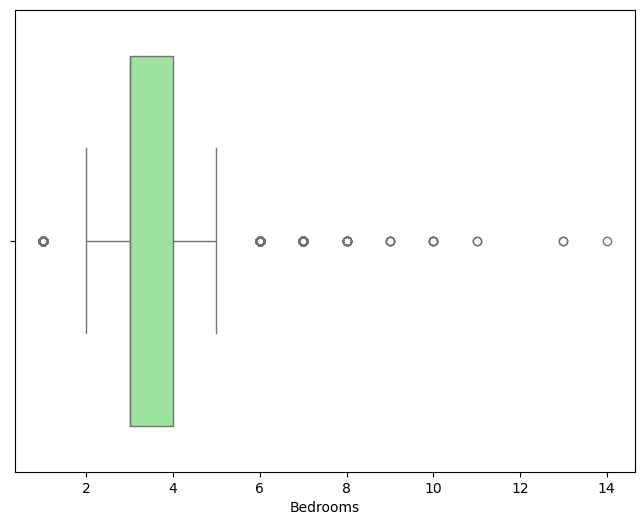

In [23]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Bedrooms'], color='lightgreen')

<Axes: xlabel='Total Baths'>

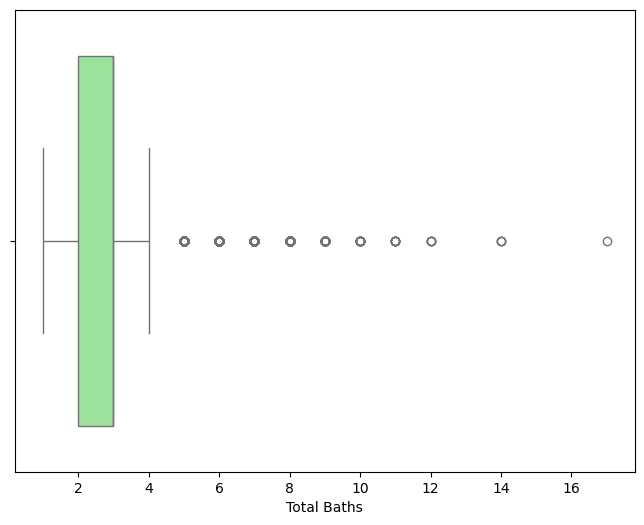

In [24]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Total Baths'], color='lightgreen')

<Axes: xlabel='Acres'>

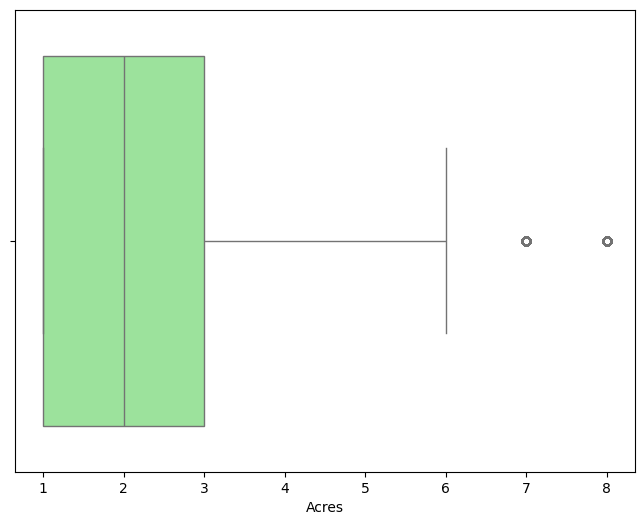

In [25]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Acres'], color='lightgreen')

<Axes: xlabel='Days on Market'>

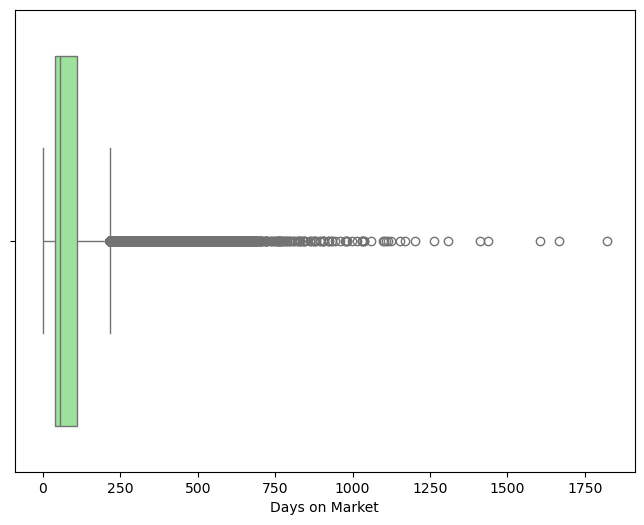

In [26]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Days on Market'], color='lightgreen')

<Axes: xlabel='Year Built'>

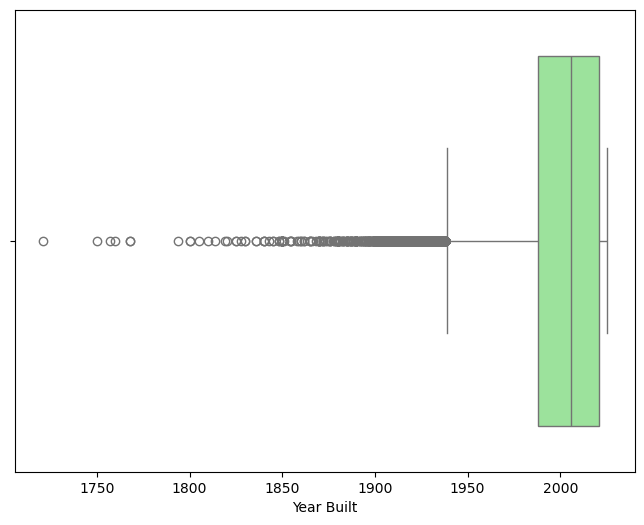

In [27]:
plt.figure(figsize=(8, 6)) 
sns.boxplot(x=sfr_df['Year Built'], color='lightgreen')

In [28]:
#Calculate the Z-score for each data point, and points with a Z-score beyond a certain threshold can be considered outliers.
from scipy.stats import zscore

z_scores = zscore(sfr_nostr_df)
abs_z_scores = np.abs(z_scores)
outliers = (abs_z_scores > 3).all(axis=1)

outliers

0         False
1         False
2         False
3         False
4         False
          ...  
112525    False
112526    False
112527    False
112528    False
112529    False
Length: 112530, dtype: bool

In [29]:
Q1 = sfr_nostr_df.quantile(0.25)
Q3 = sfr_nostr_df.quantile(0.75)
IQR = Q3 - Q1

outliers = ((sfr_nostr_df < (Q1 - 1.5 * IQR)) | (sfr_nostr_df > (Q3 + 1.5 * IQR))).any(axis=1)

outliers

0         True
1         True
2         True
3         True
4         True
          ... 
112525    True
112526    True
112527    True
112528    True
112529    True
Length: 112530, dtype: bool

<Axes: xlabel='Sold Price', ylabel='Count'>

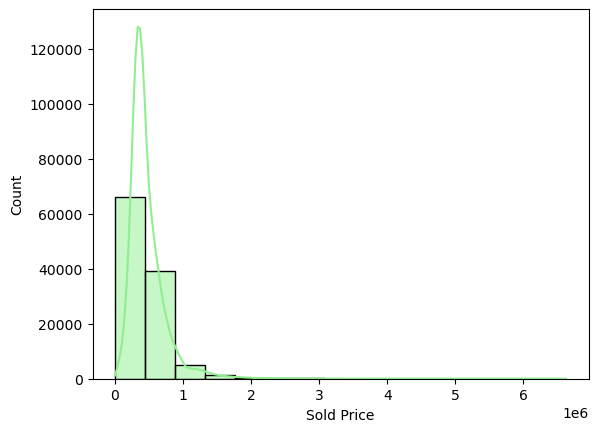

In [30]:
sns.histplot(sfr_df['Sold Price'], bins=15, kde=True, color='lightgreen')


([<matplotlib.patches.Wedge at 0x142de7510>,
 [Text(-1.0999858002283494, -0.005589212466704368, '3'),
  Text(0.9430448653786708, -0.5662741225616132, '4'),
  Text(0.752504617280802, 0.8023321014212718, '5'),
  Text(0.27182130654534, 1.0658860995941286, '2'),
  Text(0.05648071692271481, 1.0985490105661633, '6'),
  Text(0.01412591990814429, 1.0999092955270215, '1'),
  Text(0.00485199164744046, 1.0999892991193385, '7'),
  Text(0.0012589831588463013, 1.0999992795276758, '8'),
  Text(0.0007062104731324557, 1.0999997733030529, '10'),
  Text(0.000429824060960151, 1.0999999160233045, '9'),
  Text(0.00024556643878886615, 1.0999999725896017, '11'),
  Text(0.00012272801986030864, 1.0999999931535605, '13'),
  Text(3.059920457623023e-05, 1.099999999574404, '14')],
 [Text(-0.5999922546700087, -0.0030486613454751097, '50.2%'),
  Text(0.5143881083883658, -0.30887679412451624, '32.5%'),
  Text(0.41045706397134646, 0.43763569168433, '10.8%'),
  Text(0.14826616720654906, 0.5813924179604337, '5.3%'),
  Te

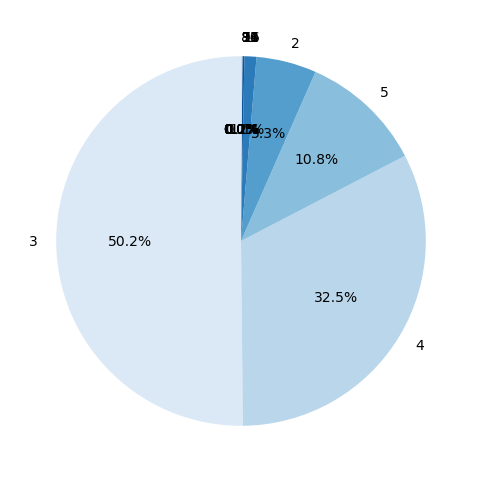

In [31]:
bedroom_counts = sfr_df['Bedrooms'].value_counts()
plt.figure(figsize=(10, 6))
plt.pie(bedroom_counts, labels=bedroom_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Blues'))


([<matplotlib.patches.Wedge at 0x143465ed0>,
 [Text(-1.0943095547157313, 0.11174344928387563, '3'),
  Text(0.6927892726304854, -0.8544255518932725, '2'),
  Text(1.0031058187149131, 0.45141856016371756, '4'),
  Text(0.5808958297607809, 0.934109220041497, '1'),
  Text(0.276223159282265, 1.0647538524354465, '5'),
  Text(0.08133686919967018, 1.0969887482143086, '6'),
  Text(0.02346036606073437, 1.099749794828031, '7'),
  Text(0.007892306803153455, 1.0999716866780367, '8'),
  Text(0.0032552192624906314, 1.099995183420161, '9'),
  Text(0.001320518498021859, 1.0999992073773948, '10'),
  Text(0.0007063266505194006, 1.0999997732284597, '11'),
  Text(0.00036852103834448337, 1.0999999382692003, '12'),
  Text(0.00015355380534803716, 1.0999999892823766, '14'),
  Text(3.071538198707664e-05, 1.0999999995711662, '17')],
 [Text(-0.5968961207540352, 0.06095097233665943, '46.8%'),
  Text(0.37788505779844656, -0.46605030103269407, '28.2%'),
  Text(0.5471486283899526, 0.24622830554384592, '13.6%'),
  Text(

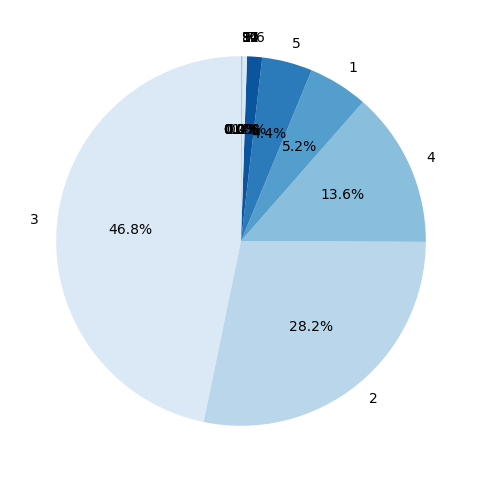

In [32]:
bathroom_counts = sfr_df['Total Baths'].value_counts()
plt.figure(figsize=(10, 6))
plt.pie(bathroom_counts, labels=bathroom_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Blues'))


In [33]:
# Compute correlation matrix
corr_matrix = sfr_nostr_df.corr()

<Axes: >

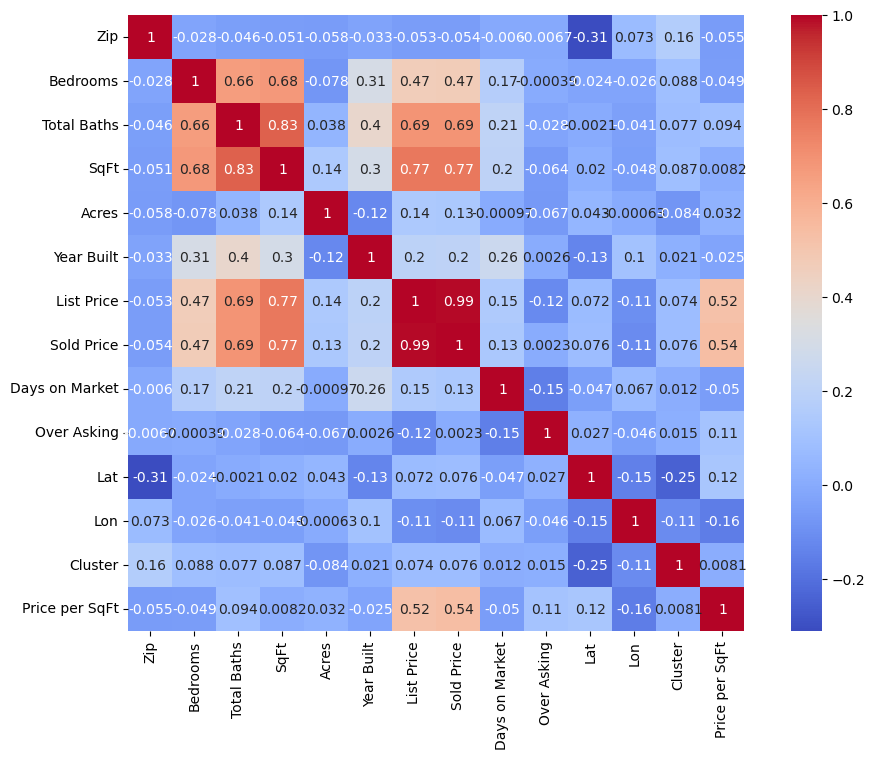

In [34]:
# Generate heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

In [35]:
# Save the DataFrame to a CSV file
sfr_df.to_csv('Clean_Data/mls_condo_cleaned_3.csv', index=False)